<center> 
    
# Assignment 7 
    
# Train your model on COCO using Bahdenau Attention
    
</center>

# Import necessary libraries

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import sys
import os
import pickle
from PIL import Image
#from cache import cache

In [39]:
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, GRU, Embedding
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [3]:
tf.__version__

'2.15.0'

# Laod COCO dataset

In [2]:
from pathlib import Path
from pycocotools.coco import COCO
dataDir=Path('coco2017/train2017')
annFile = Path('coco2017/annotations/person_keypoints_train2017.json')
coco = COCO(annFile)
imgIds = coco.getImgIds()
imgs = coco.loadImgs(imgIds[-3:])
imgs

loading annotations into memory...
Done (t=3.24s)
creating index...
index created!


[{'license': 3,
  'file_name': '000000516168.jpg',
  'coco_url': 'http://images.cocodataset.org/train2017/000000516168.jpg',
  'height': 480,
  'width': 640,
  'date_captured': '2013-11-25 21:03:34',
  'flickr_url': 'http://farm3.staticflickr.com/2379/2293730995_e2381ffa38_z.jpg',
  'id': 516168},
 {'license': 4,
  'file_name': '000000547503.jpg',
  'coco_url': 'http://images.cocodataset.org/train2017/000000547503.jpg',
  'height': 375,
  'width': 500,
  'date_captured': '2013-11-25 21:20:21',
  'flickr_url': 'http://farm1.staticflickr.com/178/423174638_1c6245ee20_z.jpg',
  'id': 547503},
 {'license': 4,
  'file_name': '000000475546.jpg',
  'coco_url': 'http://images.cocodataset.org/train2017/000000475546.jpg',
  'height': 375,
  'width': 500,
  'date_captured': '2013-11-25 21:20:23',
  'flickr_url': 'http://farm1.staticflickr.com/167/423175046_6cd9d0205a_z.jpg',
  'id': 475546}]

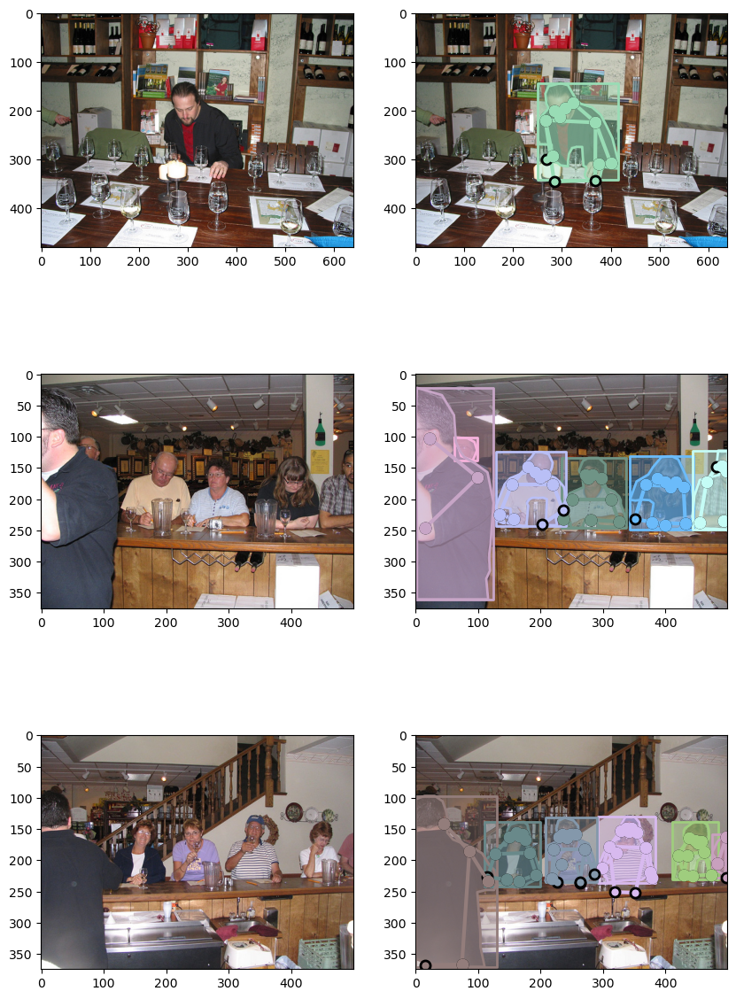

In [6]:
import skimage.io as io

_,axs = plt.subplots(len(imgs),2,figsize=(10,5 * len(imgs)))
for img, ax in zip(imgs, axs):
    I = io.imread(dataDir/img['file_name'])
    annIds = coco.getAnnIds(imgIds=[img['id']])
    anns = coco.loadAnns(annIds)
    ax[0].imshow(I)
    ax[1].imshow(I)
    plt.sca(ax[1])
    coco.showAnns(anns, draw_bbox=True)

In [7]:
import tensorflow as tf
import matplotlib.pyplot as plt
# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle
from os import listdir
from os.path import isfile, join

In [11]:
train_images_path = 'coco2017/train2017'

In [12]:
filenames_train = [f for f in listdir(train_images_path) if isfile(join(train_images_path, f))]
filenames_train[0:10]

['000000109622.jpg',
 '000000160694.jpg',
 '000000308590.jpg',
 '000000327573.jpg',
 '000000062929.jpg',
 '000000512793.jpg',
 '000000371735.jpg',
 '000000148118.jpg',
 '000000309856.jpg',
 '000000141882.jpg']

In [13]:
import json

def file_read(fname):
    content_array = []
    with open(fname) as f:
        #Content_list is the list that contains the read lines.     
        for line in f:
            content_array.append(line[:-1])
        return content_array

train_images_file = open('coco2017/annotations/instances_train2017.json')
train_images_json = json.load(train_images_file)

In [14]:
# Iterating through the json
for i in train_images_json['images']:
    #print(i['file_name'])
    print(i)
    break

{'license': 3, 'file_name': '000000391895.jpg', 'coco_url': 'http://images.cocodataset.org/train2017/000000391895.jpg', 'height': 360, 'width': 640, 'date_captured': '2013-11-14 11:18:45', 'flickr_url': 'http://farm9.staticflickr.com/8186/8119368305_4e622c8349_z.jpg', 'id': 391895}


In [16]:
train_captions_file = open('coco2017/annotations/captions_train2017.json')
train_captions_json = json.load(train_captions_file)

In [17]:
# Iterating through the json
for i in train_captions_json['annotations']:
    #print(i['file_name'])
    print(i)
    break

{'image_id': 203564, 'id': 37, 'caption': 'A bicycle replica with a clock as the front wheel.'}


In [18]:
train_filenames = []
for i in train_images_json['images']:
    train_filenames.append((i['file_name'], i['id']))
    
train_captions = []
for i in train_captions_json['annotations']:
    train_captions.append((i['image_id'], i['caption']))
    
ids_files = dict()
for i in train_filenames:
    ids_files[i[1]] = i[0]
    
ids_captions = dict()
for i in train_captions:
    ids_captions[i[0]] = i[1]
    
train_filenames = []
train_captions = []
for k,v in ids_files.items():
    train_filenames.append(v)
    train_captions.append(ids_captions[k])
    
list(zip(train_filenames[:10], train_captions[:10]))

[('000000391895.jpg',
  'A man in a red shirt and a red hat is on a motorcycle on a hill side.'),
 ('000000522418.jpg',
  "A woman marking a cake with the back of a chef's knife. "),
 ('000000184613.jpg',
  'A boy holding an umbrella while standing next to livestock.'),
 ('000000318219.jpg', 'a young kid with head phones on using a computer '),
 ('000000554625.jpg',
  'A small child wearing headphones plays on the computer.'),
 ('000000574769.jpg', 'A woman is holding a cat in her kitchen.'),
 ('000000060623.jpg',
  'A little girl is getting ready to blow out a candle on a small dessert.'),
 ('000000309022.jpg', 'Food cooks in a pot on a stove in a kitchen.'),
 ('000000005802.jpg', 'two men in white shirts in a large steel kitchen'),
 ('000000222564.jpg',
  'Two cooks are near the stove in a stainless steel kitchen.')]

In [19]:
val_images_file = open('coco2017/annotations/instances_val2017.json')
val_images_json = json.load(val_images_file)

val_captions_file = open('coco2017/annotations/captions_val2017.json')
val_captions_json = json.load(val_captions_file)

In [21]:
from os.path import exists

val_filenames = []
for i in val_images_json['images']:
    val_filenames.append((i['file_name'], i['id'])) 
#print(val_filenames[:10])
    
val_captions = []
for i in val_captions_json['annotations']:
    val_captions.append((i['image_id'], i['caption']))   
#print(val_captions[:10])
    
ids_files = dict()
for i in val_filenames:
    ids_files[i[1]] = i[0]
    
ids_captions = dict()
for i in val_captions:
    ids_captions[i[0]] = i[1]
   
i = 0
for k,v in ids_captions.items():
    print(k, v)
    i += 1
    if 10 < i:
        break
    
val_filenames = []
val_captions = []
for k,v in ids_files.items():
    if k in ids_captions and exists('coco2017/test2017'):
        val_filenames.append(v)
        val_captions.append(ids_captions[k])
    
list(zip(val_filenames[:10], val_captions[:10]))

179765 A motorcycle with its brake extended standing outside
190236 A desk and chair in an office cubicle.
331352 Off white toilet with a faucet and controls. 
517069 A woman and another woman waiting at a stop.
182417 This is a picture of an extremely fancy desert.
46378 A cat eating a dead bird on the ground.
93437 An old man standing in a kitchen posing for a picture.
172330 A grey and white cat standing in the grass in a parking lot. 
472678 A desk with two monitors depicting security cameras.
314251 A group of scooters rides down a street
223747 Man sleeping next to a cat on a bed. 


[('000000397133.jpg',
  'A table with pies being made and a person standing near a wall with pots and pans hanging on the wall.'),
 ('000000037777.jpg', 'A kitchen that has a bowl of fruit on the table.'),
 ('000000252219.jpg',
  'People are walking on the street by a homeless person.'),
 ('000000087038.jpg', 'a man falls off his skateboard in a skate park.'),
 ('000000174482.jpg', 'a bike sits parked next to a street '),
 ('000000403385.jpg',
  'A very big whit rest room with a shabby looking shower.'),
 ('000000006818.jpg',
  'This picture looks like a janitors closet with buckets on the floor.'),
 ('000000480985.jpg', 'The front end of a red motorcycle that is on display.'),
 ('000000458054.jpg', 'LOTS OF BROKEN TOILETS SITTING OUT ON A LAWN'),
 ('000000331352.jpg', 'Off white toilet with a faucet and controls. ')]

In [22]:
len(train_filenames), len(train_captions)

(118287, 118287)

In [23]:
train_filenames_mini = train_filenames[0:1000]
train_captions_mini = train_captions[0:1000]

In [24]:
val_filenames_mini = train_filenames[1000:1100]
val_captions_mini = train_captions[1000:1100]

In [25]:
len(train_filenames_mini), len(val_filenames_mini)

(1000, 100)

In [26]:
import tensorflow as tf

# You'll generate plots of attention in order to see which parts of an image
# our model focuses on during captioning
import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle

In [27]:
len(train_filenames_mini), len(train_captions_mini)

(1000, 1000)

In [28]:
img_name_vector = []
train_captions = train_captions_mini
for i in range(len(train_filenames_mini)):
    img_name_vector.append('coco2017/train2017/' + train_filenames_mini[i])

In [29]:
len(train_captions), len(img_name_vector)

(1000, 1000)

In [33]:
train_captions[500], img_name_vector[500]

('Pancakes on a plate with banana, sauce and whipped cream toppings',
 'coco2017/train2017/000000321079.jpg')

# Getting VGG-16 Model

In [41]:
image_model = VGG16(include_top=True, weights='imagenet')

553467096/553467096 [==============================] - 14s 0us/step


In [42]:
image_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

# Image processing using inception v3

In [43]:
def load_image(image_path):
    #print('load_image: ', image_path)
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

In [44]:
image_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [45]:
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

87910968/87910968 [==============================] - 11s 0us/step


In [46]:
image_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, None, None, 32)       0         ['batch_normalizati

 conv2d_11 (Conv2D)          (None, None, None, 32)       6144      ['average_pooling2d[0][0]']   
                                                                                                  
 batch_normalization_5 (Bat  (None, None, None, 64)       192       ['conv2d_5[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_7 (Bat  (None, None, None, 64)       192       ['conv2d_7[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_10 (Ba  (None, None, None, 96)       288       ['conv2d_10[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_17 (Activation)  (None, None, None, 96)       0         ['batch_normalization_17[0][0]
                                                                    ']                            
                                                                                                  
 activation_18 (Activation)  (None, None, None, 64)       0         ['batch_normalization_18[0][0]
                                                                    ']                            
                                                                                                  
 mixed1 (Concatenate)        (None, None, None, 288)      0         ['activation_12[0][0]',       
                                                                     'activation_14[0][0]',       
                                                                     'activation_17[0][0]',       
          

                                                                                                  
 conv2d_28 (Conv2D)          (None, None, None, 96)       55296     ['activation_27[0][0]']       
                                                                                                  
 batch_normalization_28 (Ba  (None, None, None, 96)       288       ['conv2d_28[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_28 (Activation)  (None, None, None, 96)       0         ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, None, None, 384)      995328    ['mixed2[0][0]']              
          

 conv2d_30 (Conv2D)          (None, None, None, 192)      147456    ['mixed3[0][0]']              
                                                                                                  
 conv2d_33 (Conv2D)          (None, None, None, 192)      172032    ['activation_32[0][0]']       
                                                                                                  
 conv2d_38 (Conv2D)          (None, None, None, 192)      172032    ['activation_37[0][0]']       
                                                                                                  
 conv2d_39 (Conv2D)          (None, None, None, 192)      147456    ['average_pooling2d_3[0][0]'] 
                                                                                                  
 batch_normalization_30 (Ba  (None, None, None, 192)      576       ['conv2d_30[0][0]']           
 tchNormalization)                                                                                
          

                                                                    ']                            
                                                                                                  
 average_pooling2d_4 (Avera  (None, None, None, 768)      0         ['mixed4[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_40 (Conv2D)          (None, None, None, 192)      147456    ['mixed4[0][0]']              
                                                                                                  
 conv2d_43 (Conv2D)          (None, None, None, 192)      215040    ['activation_42[0][0]']       
                                                                                                  
 conv2d_48 (Conv2D)          (None, None, None, 192)      215040    ['activation_47[0][0]']       
          

                                                                                                  
 activation_52 (Activation)  (None, None, None, 160)      0         ['batch_normalization_52[0][0]
                                                                    ']                            
                                                                                                  
 activation_57 (Activation)  (None, None, None, 160)      0         ['batch_normalization_57[0][0]
                                                                    ']                            
                                                                                                  
 average_pooling2d_5 (Avera  (None, None, None, 768)      0         ['mixed5[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_50

 batch_normalization_62 (Ba  (None, None, None, 192)      576       ['conv2d_62[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_67 (Ba  (None, None, None, 192)      576       ['conv2d_67[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_62 (Activation)  (None, None, None, 192)      0         ['batch_normalization_62[0][0]
                                                                    ']                            
                                                                                                  
 activation_67 (Activation)  (None, None, None, 192)      0         ['batch_normalization_67[0][0]
          

                                                                                                  
 conv2d_71 (Conv2D)          (None, None, None, 320)      552960    ['activation_70[0][0]']       
                                                                                                  
 conv2d_75 (Conv2D)          (None, None, None, 192)      331776    ['activation_74[0][0]']       
                                                                                                  
 batch_normalization_71 (Ba  (None, None, None, 320)      960       ['conv2d_71[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_75 (Ba  (None, None, None, 192)      576       ['conv2d_75[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_82 (Activation)  (None, None, None, 384)      0         ['batch_normalization_82[0][0]
                                                                    ']                            
                                                                                                  
 activation_83 (Activation)  (None, None, None, 384)      0         ['batch_normalization_83[0][0]
                                                                    ']                            
                                                                                                  
 batch_normalization_84 (Ba  (None, None, None, 192)      576       ['conv2d_84[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activatio

                                                                                                  
 activation_88 (Activation)  (None, None, None, 384)      0         ['batch_normalization_88[0][0]
                                                                    ']                            
                                                                                                  
 activation_91 (Activation)  (None, None, None, 384)      0         ['batch_normalization_91[0][0]
                                                                    ']                            
                                                                                                  
 activation_92 (Activation)  (None, None, None, 384)      0         ['batch_normalization_92[0][0]
                                                                    ']                            
                                                                                                  
 batch_nor

# features from v3

In [47]:
len(img_name_vector)

1000

In [48]:
len(img_name_vector), img_name_vector[0]

(1000, 'coco2017/train2017/000000391895.jpg')

In [61]:
# Get unique images
encode_train = img_name_vector

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

In [62]:
image_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [63]:
example_path = ''
for img, path in image_dataset:
    print(img, path)
    example_path = path[10]
    break

tf.Tensor(
[[[[ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   ...
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  [[ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   ...
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  [[ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   ...
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  ...

  [[ 0.07153571 -0.20143962 -0.35911745]
   [ 0.41787887  0.16716409 -0.22405732]
   [ 0.46443546  0.22534394 -0.05119044]
   ...
   [-0.62330407 -0.54130876 -0.9591519 ]
   [-0.3896513  -0.36615378 -0.6969954 ]
   [-

In [64]:
example_path = example_path.numpy().decode()
example_path

'coco2017/train2017/000000118113.jpg'

In [65]:
example_path[0:img_name_vector[0].rindex('/')] + '.npy' + example_path[img_name_vector[0].rindex('/'):]

'coco2017/train2017.npy/000000118113.jpg'

In [66]:
for img, path in image_dataset:
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        print(path_of_feature)
        print(path_of_feature[0:path_of_feature.rindex('/')] + '.npy' + path_of_feature[path_of_feature.rindex('/'):])
        break
    break

coco2017/train2017/000000391895.jpg
coco2017/train2017.npy/000000391895.jpg


In [67]:
len(image_dataset)

63

In [69]:
from tqdm import tqdm

for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        new_path_of_feature = path_of_feature[0:path_of_feature.rindex('/')] + '.npy' + path_of_feature[path_of_feature.rindex('/'):]
        np.save(new_path_of_feature, bf.numpy())

100%|███████████████████████████████████████████| 63/63 [00:35<00:00,  1.76it/s]


# Preprocessing and tokenization

In [70]:
len(train_captions), len(img_name_vector)

(1000, 1000)

In [71]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [72]:
'<start> ' + train_captions[0] + ' <end>'

'<start> A man in a red shirt and a red hat is on a motorcycle on a hill side. <end>'

In [73]:
train_captions_wrapped = []
for c in train_captions:
    train_captions_wrapped.append('<start> ' + c + ' <end>')
    
train_captions_wrapped[0]

'<start> A man in a red shirt and a red hat is on a motorcycle on a hill side. <end>'

In [74]:
# Choose the top 5000 words from the vocabulary
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions_wrapped)
train_seqs = tokenizer.texts_to_sequences(train_captions_wrapped)

In [76]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [77]:
len(train_captions_wrapped), train_captions_wrapped[500],

(1000,
 '<start> Pancakes on a plate with banana, sauce and whipped cream toppings <end>')

In [78]:
train_seqs = tokenizer.texts_to_sequences(train_captions_wrapped)

In [79]:
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [80]:
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)
max_length

25

In [81]:
len(cap_vector[0]), cap_vector[0]

(25,
 array([  3,   2,  14,   8,   2,  49, 258,  10,   2,  49, 259,  11,   5,
          2, 113,   5,   2, 232,  83,   4,   0,   0,   0,   0,   0],
       dtype=int32))

# Test sets

In [82]:
len(img_name_vector),len(cap_vector)

(1000, 1000)

In [83]:
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.1,
                                                                    random_state=0)

In [84]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(900, 900, 100, 100)

In [85]:
img_name_train[400:402], tokenizer.sequences_to_texts(cap_train[400:402])

(['coco2017/train2017/000000201925.jpg',
  'coco2017/train2017/000000290570.jpg'],
 ['<start> a cake in a pan sitting on the rack of an oven <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>',
  '<start> sheep are grazing in a snow dusted field <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>'])

# Training the model

In [86]:
BATCH_SIZE = 16
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE

# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [94]:
name = 'coco2017/train2017/0000134.jpg'
new_name = name[0:name.rindex('/')] + '.npy' + name[name.rindex('/'):] + '.npy'
new_name

'coco2017/train2017.npy/0000134.jpg.npy'

In [95]:
def map_func(img_name, cap):
    #img_tensor = np.load(img_name.decode('utf-8')+'.npy')
    name = img_name.decode('utf-8')
    new_name = name[0:name.rindex('/')] + '.npy' + name[name.rindex('/'):] + '.npy'
    img_tensor = np.load(new_name)
    return img_tensor, cap

In [96]:
len(img_name_train), len(cap_train)

(900, 900)

In [97]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Bahdanau Attention

In [58]:
class BahdanauAttention(tf.keras.Model):
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, features, hidden):
        # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

        # hidden shape == (batch_size, hidden_size)
        # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # score shape == (batch_size, 64, hidden_size)
        score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

        # attention_weights shape == (batch_size, 64, 1)
        # you get 1 at the last axis because you are applying score to self.V
        attention_weights = tf.nn.softmax(self.V(score), axis=1)

        # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

In [87]:
embedding_dim

256

In [88]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [89]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size):
        super(RNN_Decoder, self).__init__()
        self.units = units

        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')
        
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        # new new new
        self.attention = BahdanauAttention(self.units)

    def call(self, x, features, hidden):
        # defining attention as a separate model
        context_vector, attention_weights = self.attention(features, hidden)

        # x shape after passing through embedding == (batch_size, 1, embedding_dim)
        x = self.embedding(x)

        # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        # passing the concatenated vector to the GRU
        output, state = self.gru(x)

        # shape == (batch_size, max_length, hidden_size)
        x = self.fc1(output)

        # x shape == (batch_size * max_length, hidden_size)
        x = tf.reshape(x, (-1, x.shape[2]))

        # output shape == (batch_size * max_length, vocab)
        x = self.fc2(x)

        return x, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

Instantiate CNN encoder and decoder

In [90]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

Optimizer and loss function

In [91]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

In [99]:
for (batch, (img_tensor, target)) in enumerate(dataset):
    
    print('img_tensor, target:', img_tensor.shape, target.shape)
    
    hidden = decoder.reset_state(batch_size=target.shape[0])
    print('hidden:', hidden.shape)
    
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    print('dec_input:', dec_input.shape)
    
    features = encoder(img_tensor)
    print('features', features.shape)
    
    predictions, hidden, junk = decoder(dec_input, features, hidden)
    print('predictions, hidden, junk:', predictions.shape, hidden.shape, junk.shape)
    
    print('target[:, 1]:', target[:, 1].shape)
    loss = loss_function(target[:, 1], predictions)
    print('loss:', loss.numpy())
    
    dec_input = tf.expand_dims(target[:, 1], 1)
    print('dec_input:', dec_input.shape)
    
    break

img_tensor, target: (16, 64, 2048) (16, 25)
hidden: (16, 512)
dec_input: (16, 1)
features (16, 64, 256)
predictions, hidden, junk: (16, 5001) (16, 512) (16, 64, 1)
target[:, 1]: (16,)
loss: 8.50795
dec_input: (16, 1)


In [100]:
@tf.function
def train_step(img_tensor, target):
    loss = 0

    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
            # passing the features through the decoder
            predictions, hidden, _ = decoder(dec_input, features, hidden)

            loss += loss_function(target[:, i], predictions)

            # using teacher forcing
            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))
    trainable_variables = encoder.trainable_variables + decoder.trainable_variables
    gradients = tape.gradient(loss, trainable_variables)
    optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, total_loss

# Epochs

In [162]:
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [163]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    # restoring the latest checkpoint in checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)

In [164]:
EPOCHS = 20
loss_plot = []
for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)


    if epoch % 5 == 0:
        ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 9 Batch 0 Loss 0.1579
Epoch 9 Loss 0.165668
Time taken for 1 epoch 7.532548666000366 sec

Epoch 10 Batch 0 Loss 0.0832
Epoch 10 Loss 0.126482
Time taken for 1 epoch 7.388211011886597 sec

Epoch 11 Batch 0 Loss 0.0397
Epoch 11 Loss 0.074238
Time taken for 1 epoch 7.640654802322388 sec

Epoch 12 Batch 0 Loss 0.1597
Epoch 12 Loss 0.075537
Time taken for 1 epoch 7.404098987579346 sec

Epoch 13 Batch 0 Loss 0.0476
Epoch 13 Loss 0.083498
Time taken for 1 epoch 7.678116083145142 sec

Epoch 14 Batch 0 Loss 0.0693
Epoch 14 Loss 0.076325
Time taken for 1 epoch 7.670119047164917 sec

Epoch 15 Batch 0 Loss 0.0804
Epoch 15 Loss 0.053154
Time taken for 1 epoch 7.429524898529053 sec

Epoch 16 Batch 0 Loss 0.0326
Epoch 16 Loss 0.047340
Time taken for 1 epoch 7.549459934234619 sec

Epoch 17 Batch 0 Loss 0.0513
Epoch 17 Loss 0.035037
Time taken for 1 epoch 7.562949180603027 sec

Epoch 18 Batch 0 Loss 0.0057
Epoch 18 Loss 0.027321
Time taken for 1 epoch 7.655810594558716 sec

Epoch 19 Batch 0 Loss 

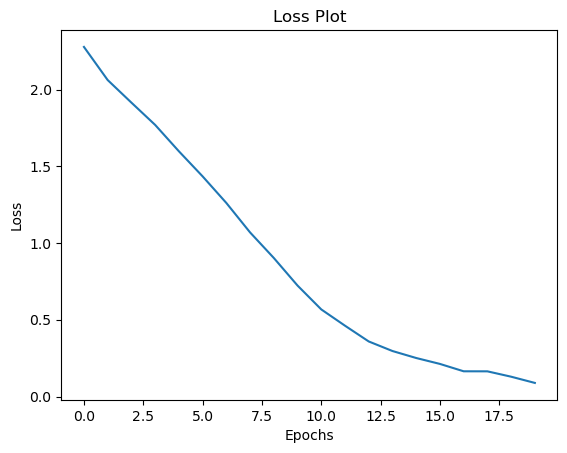

In [106]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Going for 20 another epochs

In [107]:
EPOCHS = 20

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)


    if epoch % 5 == 0:
        ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 0.0771
Epoch 1 Loss 0.075387
Time taken for 1 epoch 7.511345148086548 sec

Epoch 2 Batch 0 Loss 0.0259
Epoch 2 Loss 0.070174
Time taken for 1 epoch 7.384037733078003 sec

Epoch 3 Batch 0 Loss 0.0279
Epoch 3 Loss 0.064361
Time taken for 1 epoch 7.36858868598938 sec

Epoch 4 Batch 0 Loss 0.0741
Epoch 4 Loss 0.057315
Time taken for 1 epoch 7.416279077529907 sec

Epoch 5 Batch 0 Loss 0.0271
Epoch 5 Loss 0.062372
Time taken for 1 epoch 7.344527006149292 sec

Epoch 6 Batch 0 Loss 0.0493
Epoch 6 Loss 0.063350
Time taken for 1 epoch 7.545539855957031 sec

Epoch 7 Batch 0 Loss 0.0665
Epoch 7 Loss 0.058310
Time taken for 1 epoch 7.638957977294922 sec

Epoch 8 Batch 0 Loss 0.0421
Epoch 8 Loss 0.048940
Time taken for 1 epoch 7.467754125595093 sec

Epoch 9 Batch 0 Loss 0.0383
Epoch 9 Loss 0.049975
Time taken for 1 epoch 7.5478739738464355 sec

Epoch 10 Batch 0 Loss 0.1689
Epoch 10 Loss 0.043580
Time taken for 1 epoch 7.44867467880249 sec

Epoch 11 Batch 0 Loss 0.0187
Epoch 11 L

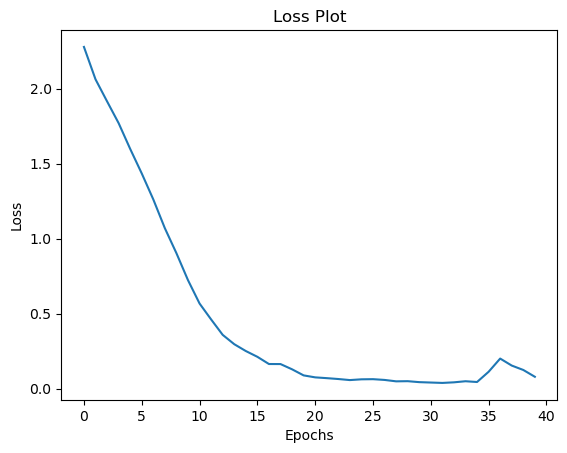

In [108]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

# Inference

In [109]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [110]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

In [111]:
len(img_name_val)

100

In [114]:
img_name_val[7]

'coco2017/train2017/000000155877.jpg'

In [115]:
cap_val[7]

array([  3,   2, 250, 180, 111,  51,   2, 110, 161,  27, 193, 180, 577,
         5,   4,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
      dtype=int32)

In [122]:
' '.join([tokenizer.index_word[i] for i in cap_val[7] if i not in [0]])

'<start> a adult sheep stands by a tree as some baby sheep look on <end>'

# Sample Image test

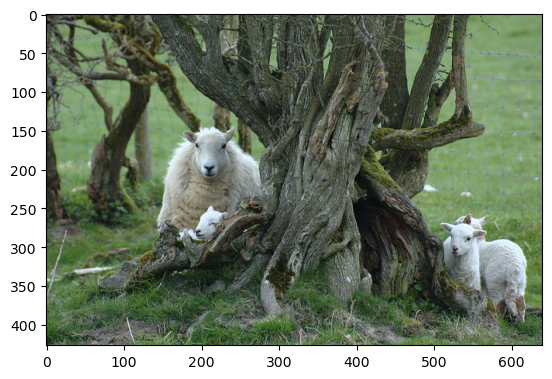

In [123]:
img = img_name_val[7]
img = Image.open(img)
img = np.array(img)
img = img / 255.0
plt.imshow(img)

Real Caption: <start> a adult sheep stands by a tree as some baby sheep look on <end>
Prediction Caption: an iphone resting not to a canoe in the water <end>


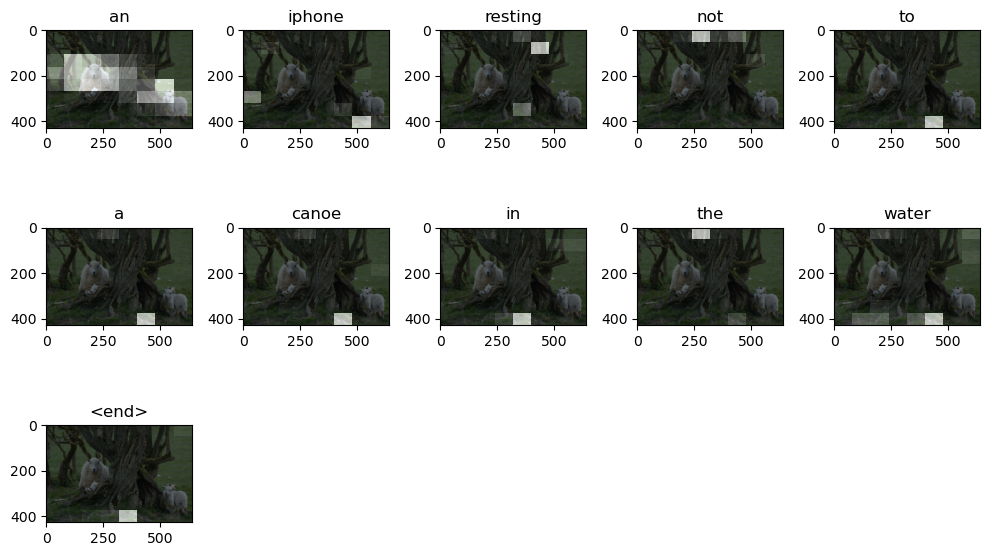

coco2017/train2017/000000155877.jpg


In [124]:
image = img_name_val[7]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[7] if i not in [0]])
result, attention_plot = evaluate(image)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)
print(image)

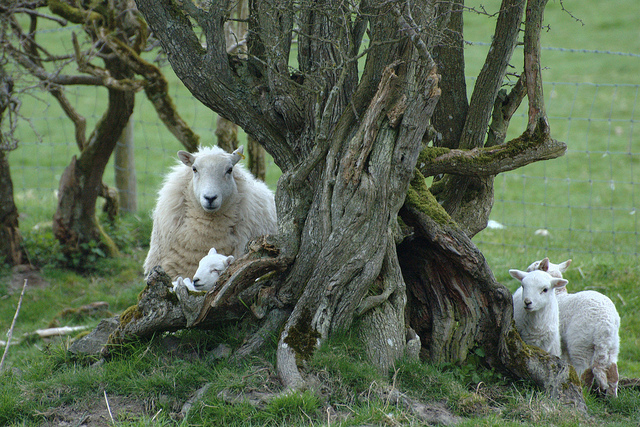

In [126]:
Image.open(image)

# User Image Test

Prediction caption: a person walking going into a cow in a stone area <end>
Original captions:
A girl on sidewalk holding hands
A girl near tree


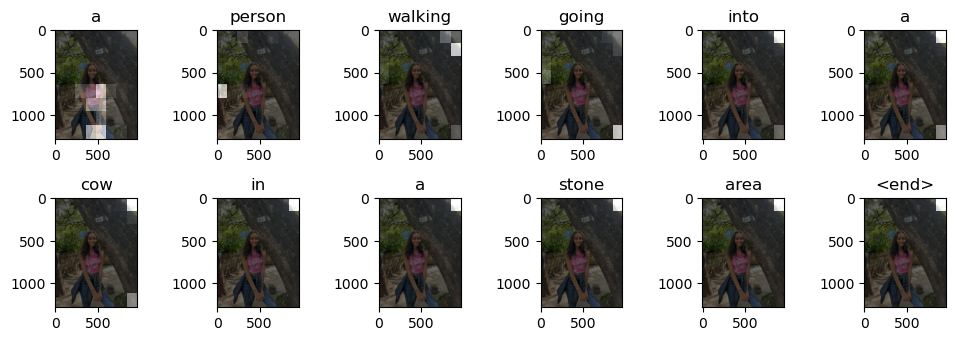

In [142]:
user_filename = 'Caption_Data/Image_1.jpeg'
        
result, attention_plot = evaluate(user_filename)
print ('Prediction caption:', ' '.join(result))
print("Original captions:")
print("A girl on sidewalk holding hands")
print("A girl near tree")

plot_attention(user_filename, result, attention_plot)



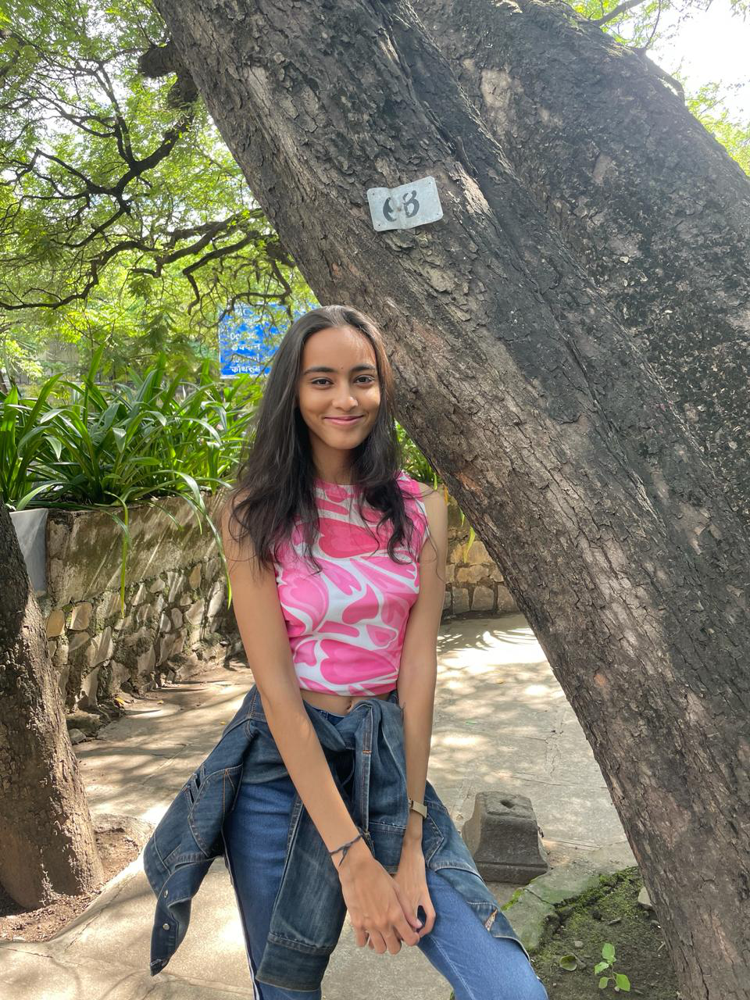

In [143]:
Image.open(user_filename)

Prediction caption: cat standing in the water <end>
Original captions:
A girl sitting near water
A girl sitting by the river


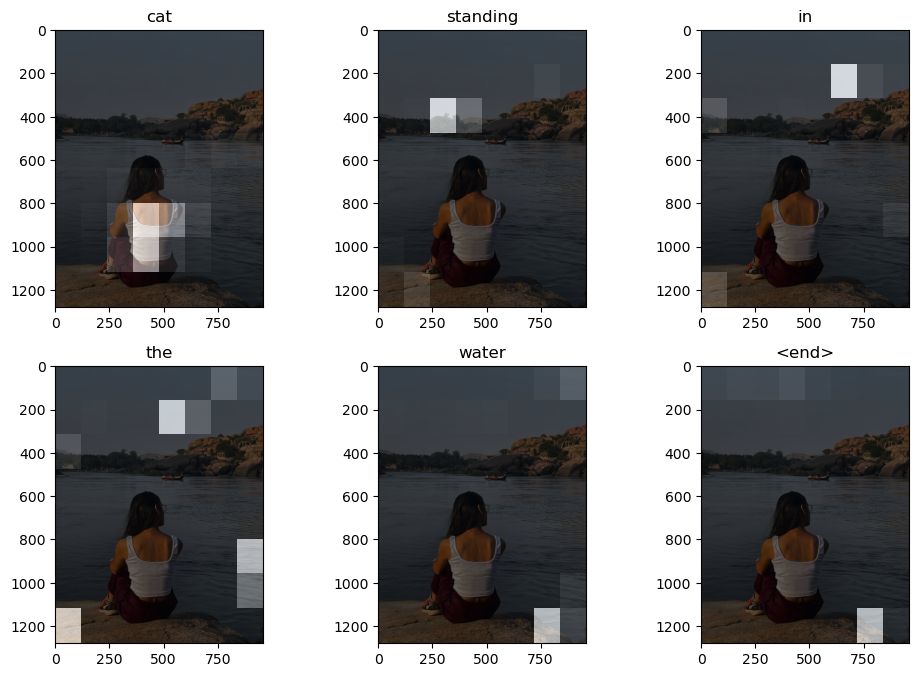

In [147]:
user_filename = 'Caption_Data/Image_2.jpeg'
        
result, attention_plot = evaluate(user_filename)
print ('Prediction caption:', ' '.join(result))
print("Original captions:")
print("A girl sitting near water")
print("A girl sitting by the river")

plot_attention(user_filename, result, attention_plot)


Prediction caption: an old bug are around crossing tower in the bainbridge background <end>
Original captions:
An old building
An old looking temple


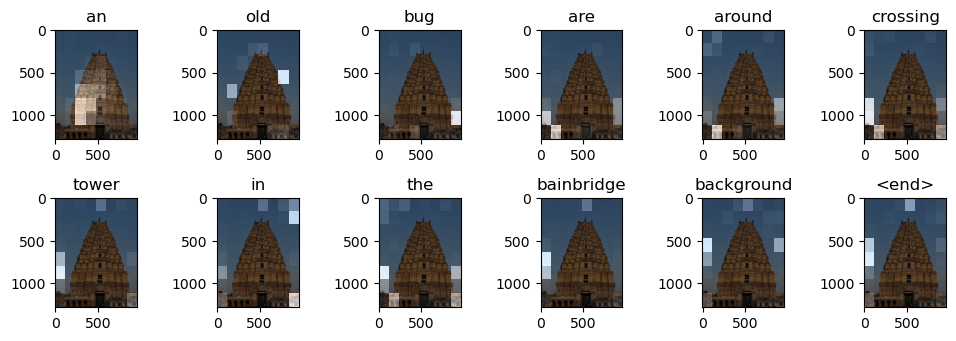

In [149]:
user_filename = 'Caption_Data/Image_3.jpeg'
        
result, attention_plot = evaluate(user_filename)
print ('Prediction caption:', ' '.join(result))

print("Original captions:")
print("An old building")
print("An old looking tower")

plot_attention(user_filename, result, attention_plot)



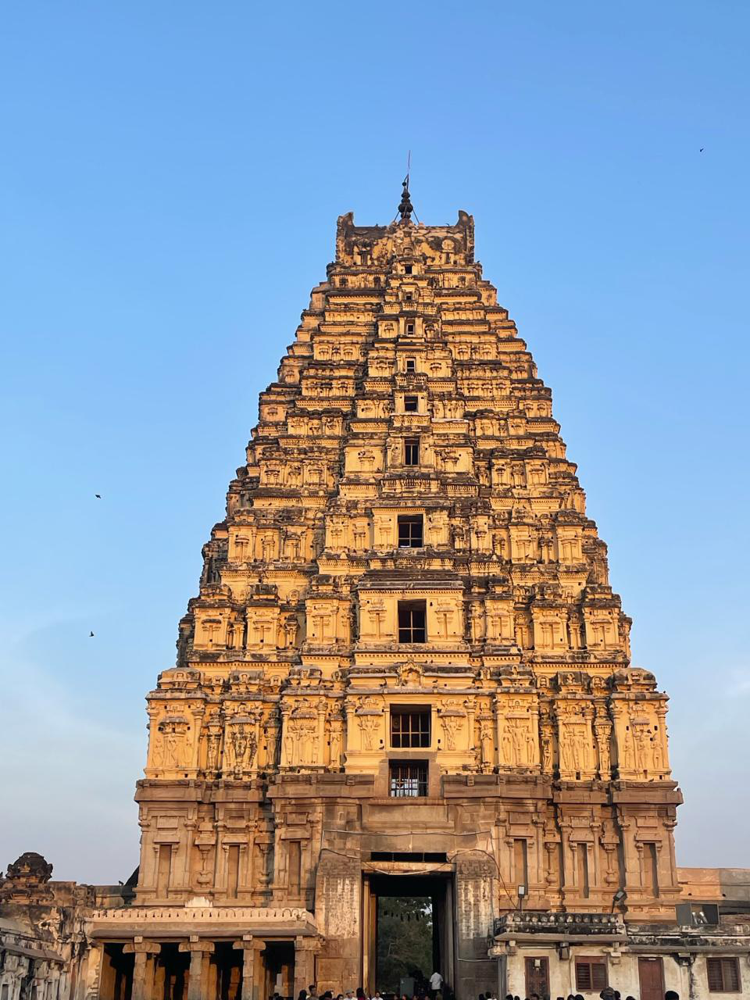

In [152]:
Image.open(user_filename)

Prediction caption: a dog laying down the water <end>
Original captions:
A girl with dog


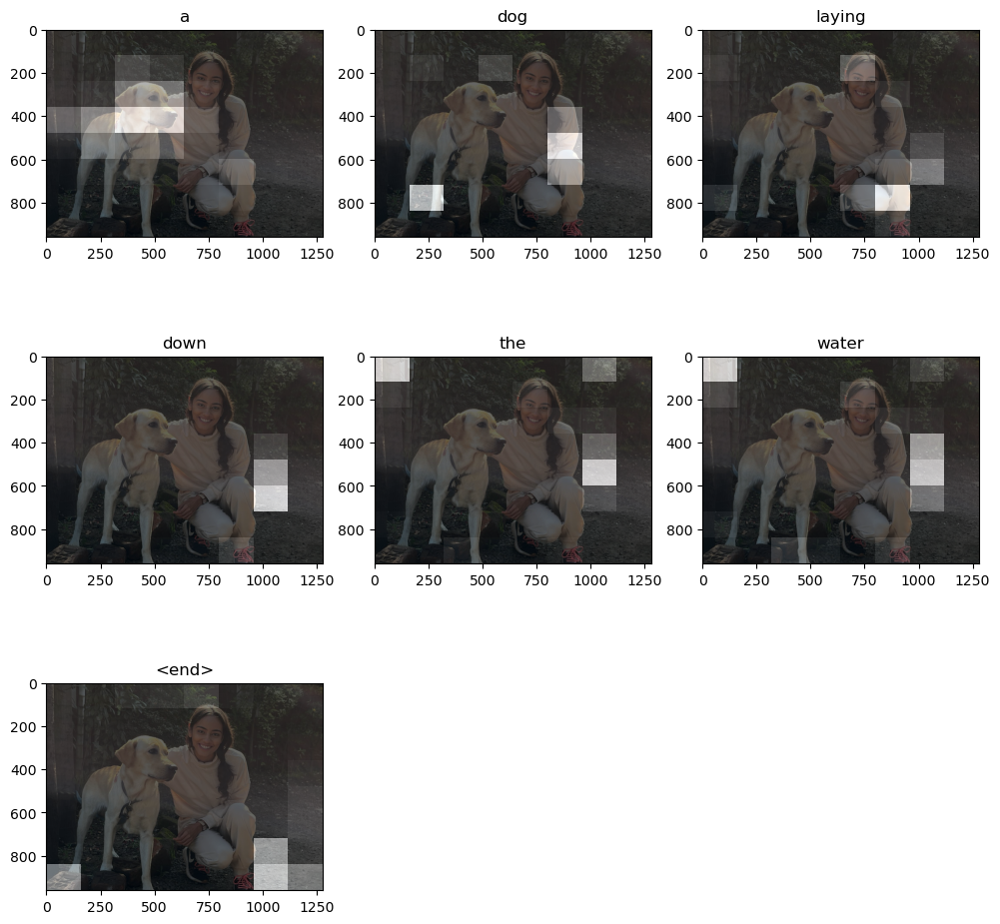

In [158]:
user_filename = 'Caption_Data/Image_5.jpeg'
        
result, attention_plot = evaluate(user_filename)
print ('Prediction caption:', ' '.join(result))
print("Original captions:")
print("A girl with dog")


plot_attention(user_filename, result, attention_plot)

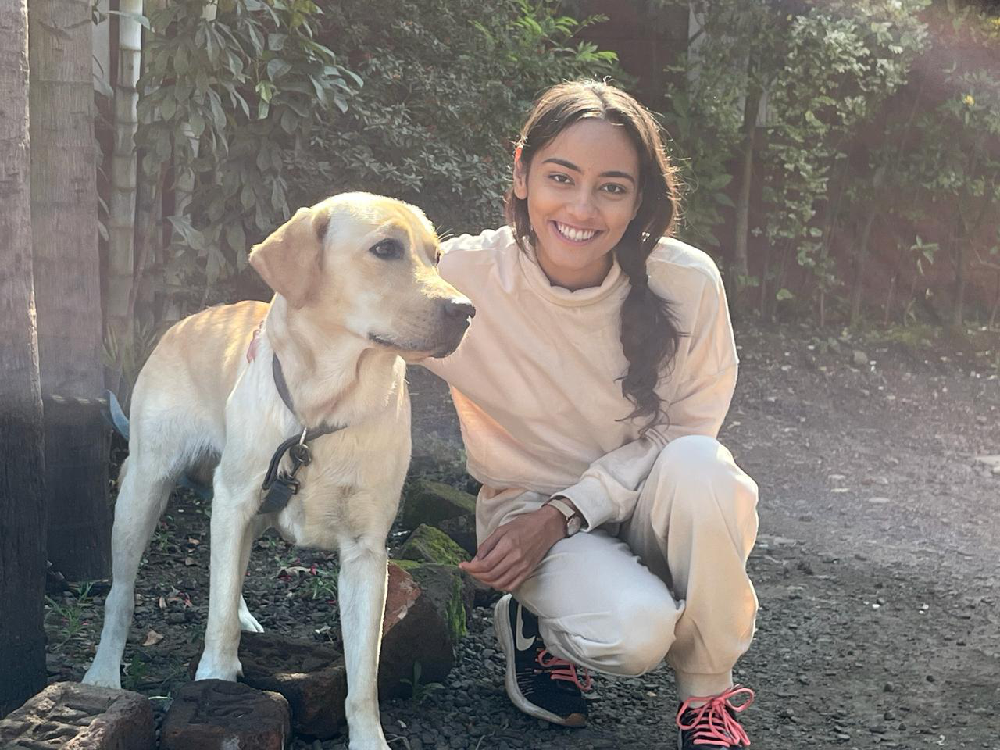

In [159]:
Image.open(user_filename)

Prediction caption: a group of people walking on the water <end>
Original captions:
A girl near the ocean at sunset
A girl at the ocean


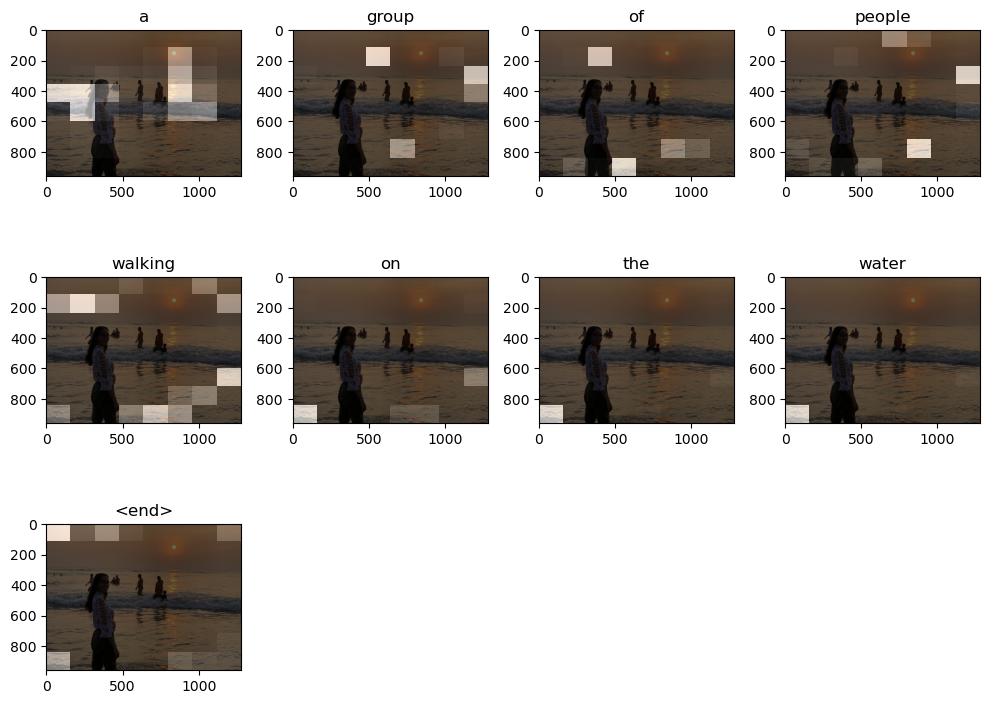

In [160]:
user_filename = 'Caption_Data/Image_18.jpeg'
        
result, attention_plot = evaluate(user_filename)
print ('Prediction caption:', ' '.join(result))
print("Original captions:")
print("A girl near the ocean at sunset")
print("A group of people at the ocean")

plot_attention(user_filename, result, attention_plot)



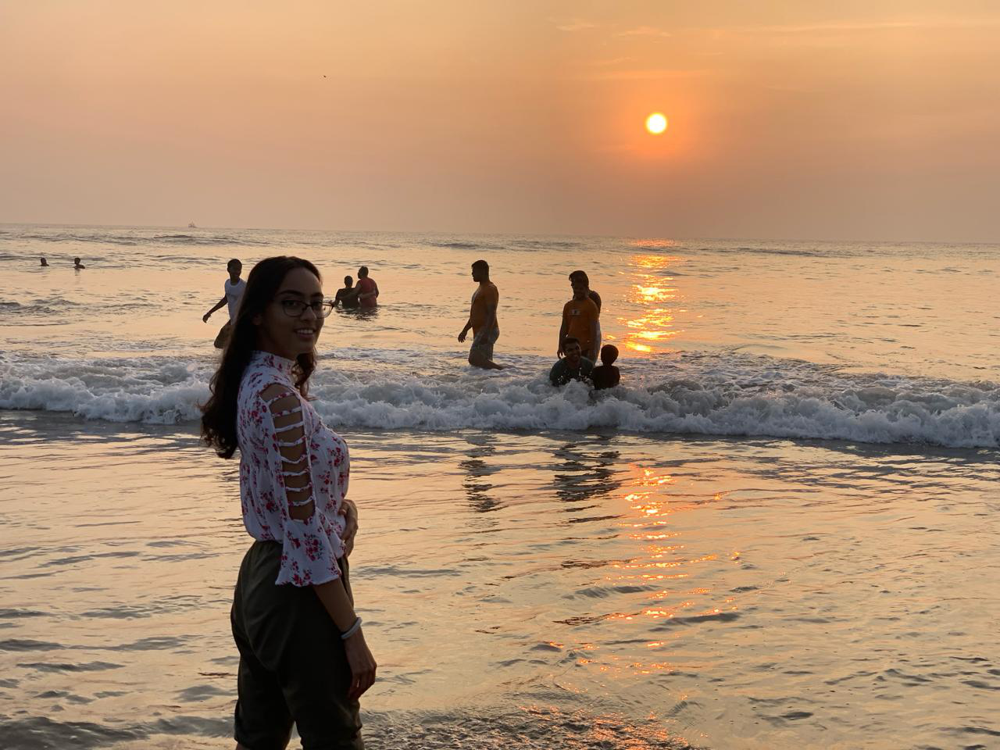

In [161]:
Image.open(user_filename)

# Conclusion

For every user image the model generates the captions which can be acceptable to some point. In the the last Image that is Image_18, the model has drafted a logical and precise caption for the picture. The model can generate better caption with more and more data fed to it.

**Answering the questions:** 

**1)How many epochs can you afford to train for?** 
40


**2)Laptop or collab?**
Laptop Using Jupyter Notebook